<a href="https://colab.research.google.com/github/anakingui/netflix-guillermo/blob/main/Prediccion_cancelaciones_hotel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 Predicción de cancelaciones de hotel.

Los datos de cancelaciones de reservaciones en un hotel, tiene un fuerte desbalance. Hay mucho menos cancelaciones, que cancelaciones, lo cual tiene sentido, de otra manera mejor cerramos el hotel =). El desbalance es medianamente grande que sí no se aplican medidas para tratar este problema, no importa que tan bueno sea tu algoritmo muy probablemente no va a lograr detectar los casos en los que sí se van a cancelar las reservaciones, que es la clase que nos interesa. Nos interesa porque como hotel, lo que quisieramos es evitar tener cuartos vacios a lo largo del año, es preferible invertir un poco más de dinero para influir en los clientes que quieren cancelar para que no cancelen. Puedes implementar alguna camapaña para promover o emocionar a los clientes para que vengan, pero primero es necesario identificar de manera sistemática quiénes serán. No quieres enviarle a todo mundo una camapaña porque te cuesta dinero (supón que les regalas una noche extra o una cena, etc).

Es necesario un downsampling para que exista la misma proporción de cancelaciones y personas que hacen uso de los servicios del hotel

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")

pd.set_option("max_columns", 999)
pd.set_option("max_rows", 999)

## Cargar los datos

Cargamos los datos. Nuestra variable a predecir es `is_canceled`. (1) es cancelada y (0) no cancelada.

In [ ]:
# https://github.com/rfordatascience/tidytuesday/tree/master/data/2020/2020-02-11
tbl_data = (
    # Read data from the internet
    pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-02-11/hotels.csv")
)

In [ ]:
tbl_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


## Análisis Exploratorio de Datos (EDA)

* Aqui hay un análisis exploratorio de datos para entender los datos.
* Revísalo cuidadosamente para entender que tienen los datos.

Este reporte se construye con una librería que se llama `pandas_profiling`. Automatiza muchas gráficas y tablas resumen que se usan en los EDA. es útil como herramienta, pero en la práctica no es suficiente, hay que seguir explorando los datos con mayor detalle. Para este proyecto es suficiente y un buen punto de partida. Si quieres conocer más puedes checar la [documentación](https://pypi.org/project/pandas-profiling/).

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 22.1 MB 26.1 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 KB 29.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 50.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 25.1 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=344582 sha256=65ce7f3be999dbb8daf38ce210f722ff9285388d834b749e073b37e984a91bb5
  Stored in directory: /tmp/pip-ephem-wheel-cache-ma5fpqn9/wheels/64/b6/85/dfc808b23666a5910371784e349d28818006ff63ed9cfeca59
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sh

In [ ]:
# En Google Colab ejecuta esta celda una sola vez. Después de instalar y reiniciar
# la sesión puedes comentar esta linea.
from pandas_profiling import ProfileReport
profile=ProfileReport(tbl_data, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Checar el desbalance en los datos.

In [ ]:
(tbl_data
     .groupby(['is_canceled'])
     .size()
     .reset_index(name = 'n_reservaciones')
     .assign(pct = lambda df_: df_.n_reservaciones / df_.n_reservaciones.sum() * 100)
     .round(1)
)

,is_canceled,n_reservaciones,pct
0,0,75166,63.0
1,1,44224,37.0


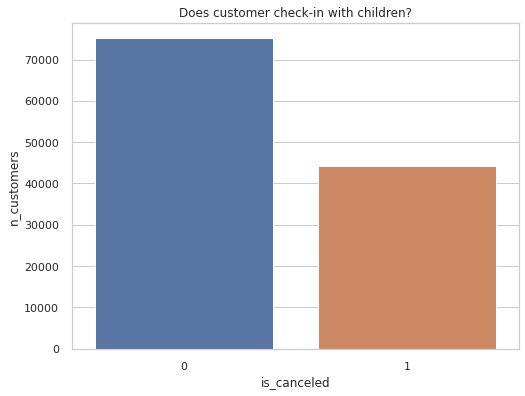

In [ ]:
fig, ax = plt.subplots(figsize = (8, 6))
sns.barplot(
    data = (tbl_data
            .groupby(['is_canceled'])
            .size()
            .reset_index(name = 'n_customers')),
    x = 'is_canceled',
    y = 'n_customers'
)
plt.title("Does customer check-in with children?")
plt.show()

## Corregir desbalance con downsampling

* Construimos una función para hacer el downsampling, con pandas.

In [ ]:
def fun_downsample(tbl):
    '''
    Función para hacer downsampling
    tbl: Son los datos originales en forma de dataframe.
    '''
    # Filtramos la clase mayoritaria y sacamos de manera aleatoria N observaciones.
    # N es igual al número de observaciones en la clase minoritaria.
    # Observa que fijo una semilla en el random_state para garantizar reproducibilidad.
    tbl_reservations_not_cancelled = (
        tbl
            .query('is_canceled == 0')
            .sample(
                n = tbl.groupby(['is_canceled']).size()[1], 
                random_state=42)
    )
    # Filtramos la clase minoritaria.
    tbl_reservations_cancelled = tbl.query('is_canceled == 1')
    
    return pd.concat([
        tbl_reservations_not_cancelled,
        tbl_reservations_cancelled
    ])

tbl_downsampled_data = fun_downsample(tbl_data)

* Ahora la proporción de las clases es 50:50
* El beneficio será que nuestro algorítmo será capaz de atrapar más verdaderos positivos que sin debalance.

In [ ]:
(tbl_downsampled_data
     .groupby(['is_canceled'])
     .size()
     .reset_index(name = 'n_reservaciones')
     .assign(pct = lambda df_: df_.n_reservaciones / df_.n_reservaciones.sum() * 100)
     .round(1)
)

,is_canceled,n_reservaciones,pct
0,0,44224,50.0
1,1,44224,50.0


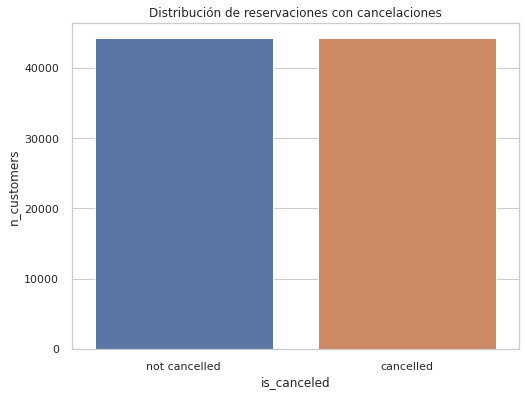

In [ ]:
fig, ax = plt.subplots(figsize = (8, 6))
sns.barplot(
    data = (tbl_downsampled_data
            .groupby(['is_canceled'])
            .size()
            .reset_index(name = 'n_customers')
            .assign(is_canceled = lambda df_: df_.is_canceled.replace({0: 'not cancelled', 1: 'cancelled'}))),
    x = 'is_canceled',
    y = 'n_customers'
)
plt.title("Distribución de reservaciones con cancelaciones")
plt.show()

In [ ]:
tbl_downsampled_data.isna().sum()

hotel                                 0
is_canceled                           0
lead_time                             0
arrival_date_year                     0
arrival_date_month                    0
arrival_date_week_number              0
arrival_date_day_of_month             0
stays_in_weekend_nights               0
stays_in_week_nights                  0
adults                                0
children                              4
babies                                0
meal                                  0
country                             316
market_segment                        0
distribution_channel                  0
is_repeated_guest                     0
previous_cancellations                0
previous_bookings_not_canceled        0
reserved_room_type                    0
assigned_room_type                    0
booking_changes                       0
deposit_type                          0
agent                             11253
company                           83979


Se hace una revisión complementaria a la que se encuentra por medio de profiling, en este caso se observa que existen datos faltantes, y por medio de la información obtenida en profiling se inicia un proceso de limpieza de datos, con la finalidad de facilitar el tratamiento de los datos por medio del 

Las columnas `is_canceled` y `reservation_status` tienen la misma información, por lo tanto basta conservar una de ellas, en este caso será `is_canceled`

In [ ]:
tbl_downsampled_data.drop(['reservation_status'],axis=1,inplace=True)

Se removerán las columnas compañia y agente, ya que tienen datos faltantes y 
la información que aportan no debería ser tan valiosa para el análisis, ya que diríamos que las cancelaciones dependen del agente que vendió o de la compañía que vendio, puede ser importante para otro tipo de análisis, además contiene la misma información que `hotel`,  `country`también se eliminará, ya que es una variable categórica con demasiados valores, lo cual puede complicar los cálculos

In [ ]:
tbl_downsampled_data.drop(['agent'],axis=1,inplace= True)

In [ ]:
tbl_downsampled_data.drop(['company'],axis=1,inplace= True)

In [ ]:
tbl_downsampled_data.drop(['country'],axis=1,inplace= True)

La variable arrival_data_week_number tiene una fuerte correlación con arrival_date_month, cosa que se espera debido a que la semana del año tiene una fuerte correlación con el mes que corre, por lo tanto se eliminará una de ellas

In [ ]:
tbl_downsampled_data.drop(['arrival_date_month'],axis=1,inplace=True)

In [ ]:
tbl_downsampled_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88448 entries, 112375 to 117295
Data columns (total 27 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           88448 non-null  object 
 1   is_canceled                     88448 non-null  int64  
 2   lead_time                       88448 non-null  int64  
 3   arrival_date_year               88448 non-null  int64  
 4   arrival_date_week_number        88448 non-null  int64  
 5   arrival_date_day_of_month       88448 non-null  int64  
 6   stays_in_weekend_nights         88448 non-null  int64  
 7   stays_in_week_nights            88448 non-null  int64  
 8   adults                          88448 non-null  int64  
 9   children                        88444 non-null  float64
 10  babies                          88448 non-null  int64  
 11  meal                            88448 non-null  object 
 12  market_segment            

In [ ]:
tbl_downsampled_data.dropna(inplace=True)

## Construimos los conjuntos de entrenamiento

* Observa que para construir los conjuntos de entrenamiento y prueba usamos `tbl_downsampled_data` los nuevos datos y no `tbl_data` que son los datos originales.

Decidi construir conjuntos de entrenamiento, validación y prueba. El conjunto de entrenamiento contiene el 80% de los datos, y el de prueba y validación contiene el 20% de los datos restantes 

In [ ]:
from sklearn.model_selection import train_test_split
train_set, validation_and_test_set = train_test_split(
    tbl_downsampled_data,							# Pasamos el conjunto de entrenamiento 
    test_size = 0.2, 		# Indicamos la cantidad de observaciones que
    									# queremos en nuestro conjunto de prueba y validación.
    									#
    stratify=tbl_downsampled_data.is_canceled,				# Indica la variable por la que vamos a estratificar.
    random_state=42						# Proporcionamos una semilla para garantizar
    									# la reproducibilidad.
)

El conjunto `validation_and_test_set` se utilizará para un proceso de validación cruzada que permitirá mejorar el modelo base

In [ ]:
print(f'train shape: {train_set.shape}')
print(f'validation shape: {validation_and_test_set.shape}')

train shape: (70755, 27)
validation shape: (17689, 27)


## A partir de aqui puedes seguir el flujo de ML que hemos visto en clase ...

Se utilizan métodos de ingeniería de características para poder trabajar las variables categóricas en un modelo de Machine Learning, las cuales serán tratadas por medio de One hot encoding, por lo tanto, en las siguientes líneas se separan las variables categóricas y numéricas, y se separa la salida en la variable y para cada uno de los conjuntos

In [ ]:
def fun_preprocess_numeric_variables(df):
    '''Regresa un data frame con las variables numéricas preprocesadas.
    
    Codificar mes como una variable numéricas
    Seleccionar el resto de las varaibles numéricas.
    
    Parameters
    ----------
    df: DataFrame
        DataFrame con los datos del banco.
        
    Returns
    -------
    DataFrame
        DataFrame con los campos numéricos preprocesados . 
    '''
 
#    month_enc = {
#        'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6, 
#        'July':7, 'August':8, 'September':9, 'October':10, 'November':11, 'December':12
#    }
#    df_month = df.arrival_date_month.map(month_enc).to_frame()
    df_numeric = df[['lead_time', 'arrival_date_year', 
                     'arrival_date_week_number', 'arrival_date_day_of_month', 
                     'stays_in_weekend_nights','adults','children','babies',
                     'previous_cancellations','previous_bookings_not_canceled',
                     'days_in_waiting_list','adr','required_car_parking_spaces']]
    return  df_numeric # aqui

In [ ]:
y_val_and_test = validation_and_test_set['is_canceled']

In [ ]:
y_val_and_test


88020     0
34936     0
118419    0
66321     1
86104     0
         ..
77411     0
46706     1
24373     0
21693     0
103503    0
Name: is_canceled, Length: 17689, dtype: int64

In [ ]:
train_num = fun_preprocess_numeric_variables(train_set)
X_validation_test_num = fun_preprocess_numeric_variables(validation_and_test_set)
df_sal_num=fun_preprocess_numeric_variables(tbl_downsampled_data)

In [ ]:
y_train = train_set['is_canceled']
y_val_and_test = validation_and_test_set['is_canceled']

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
variable_selection_categoric = ['hotel','meal',
                                'market_segment',
                                'distribution_channel','is_repeated_guest',
                                'reserved_room_type','assigned_room_type',
                                'deposit_type','customer_type']               # <--- Selecciona las variable categóricas

def encoding(tbl_train,  tbl_val_test, tbl_sal):
    '''one hot encoding de las variables categoricas  
    '''
    tbl_num_val_test= X_validation_test_num  
    tbl_num_train= train_num
    tbl_num_sal= df_sal_num

    # Categorical variables
    tbl_cat_train = tbl_train.loc[:, variable_selection_categoric]
    tbl_cat_val_test = tbl_val_test.loc[:, variable_selection_categoric]
    tbl_cat_sal = tbl_sal.loc[:, variable_selection_categoric]

    ohe = OneHotEncoder(drop = 'first', handle_unknown = 'ignore', sparse = False)
    ohe.fit(tbl_cat_train)
    col_names = ohe.get_feature_names()

    tbl_ohe_cat_train = pd.DataFrame(
        ohe.transform( tbl_cat_train )
    )
    
    
    tbl_ohe_cat_val_test = pd.DataFrame(
        ohe.transform(tbl_cat_val_test)
    )
    tbl_ohe_cat_sal = pd.DataFrame(
        ohe.transform( tbl_cat_sal )
    )
    
    # Add new column names
    tbl_ohe_cat_train.columns = col_names
    tbl_ohe_cat_val_test.columns = col_names
    tbl_ohe_cat_sal.columns = col_names 
    # Join transformed continuous + categorical variables
    
    
    tbl_train_clean = pd.concat([tbl_num_train.reset_index(drop = True),
                                 tbl_ohe_cat_train], axis = 1)    
      
  
      
    # Join transformed continuous + categorical variables
    tbl_cat_val_test_clean = pd.concat([tbl_num_val_test.reset_index(drop = True),
                                  tbl_ohe_cat_val_test], axis = 1)    
   
    
    tbl_sal_clean = pd.concat([tbl_num_sal.reset_index(drop = True),
                                 tbl_ohe_cat_sal], axis = 1)    
    
    
    return (tbl_train_clean, tbl_cat_val_test_clean,tbl_sal_clean)  

In [ ]:
X_train_clean, X_validation_test_clean, df_sal = encoding(train_set, validation_and_test_set, tbl_downsampled_data) 


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_encoders.py:170: UserWarning: Found unknown categories in columns [6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_encoders.py:170: UserWarning: Found unknown categories in columns [6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


# Modelo base de clasificación

Se utiliza como primera propuesta un modelo de arbol de decisión de profundidad máxima 2


In [ ]:
from sklearn.tree import DecisionTreeClassifier
# Especificamos un modelo de árbol de decisión
clf_dt = DecisionTreeClassifier(
    max_depth = 2,  	# Indicamos que se deben reponderar las clases.
    random_state=1645			# Indicamos una semilla para reproducibilidad.
)
# Ajustamos el modelo y predecimos
clf_dt.fit(X_train_clean, y_train)
y_pred = clf_dt.predict(X_validation_test_clean)

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


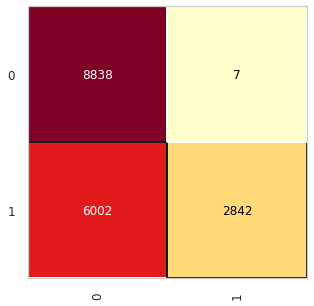

In [ ]:
from yellowbrick.classifier import ConfusionMatrix
fig, ax = plt.subplots(figsize = (5,5))
# Creamos la matrix de confusión
cm = ConfusionMatrix(
    clf_dt, 				# Pasar el estimador del mejor modelo que 
    							# se obtiene de la validación cruzada. 
   		# Indicar las etiquetas de las clases.
    							# Cuidado con el orden de los nombres.
)
# Ajustamos la visualización a los datos de entrenamiento
cm.fit(X_train_clean, y_train)
# Evaluamos los errores en la predicción utilizando los datos de validación.
cm.score(X_validation_test_clean, y_val_and_test)

# Dibjuamos la visualización.
cm.show;

La matriz de confusión del sistema muestra que el modelo de arbol de decisión predijo que 8838 personas no cancelarían, sin embargo cancelaron, de igual modo, predijo que 6002 personas no cancelarían y a estas las clasificó correctamente. Este modelo predijo que 2482 personas cancelarían  y solo cometió 7 errores de clasificación con ellas

In [ ]:
# Evaluamos los errores en la predicción utilizando los datos de validación.
cm.score(X_validation_test_clean, y_val_and_test)

0.6602973599412064

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


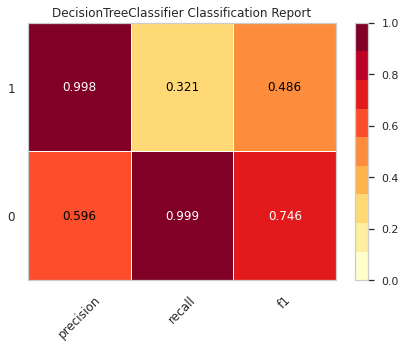

In [ ]:
from yellowbrick.classifier import ClassificationReport
fig, ax = plt.subplots(figsize = (6,5))
visualizer = ClassificationReport(
    clf_dt,					# Pasar el estimador del mejor modelo que 
#  classes=['si cancela', 'no cancela']	  							# se obtiene de la validación cruzada. 
    	# Indicar las etiquetas de las clases.
    							# Cuidado con el orden de los nombres.
)
# Ajustamos la visualización a los datos de entrenamiento
visualizer.fit(X_train_clean, y_train)
# Evaluamos los errores en la predicción utilizando los datos de validación.
visualizer.score(X_validation_test_clean, y_val_and_test)
# Dibjuamos la visualización.
visualizer.show();

Las metricas confirman la información de la matriz de confusión, se observa que este modelo de clasificación es capaz de identificar a clientes que cancelan, dicho de otro modo, si el modelo predice que un cliente cancela, su predicción es casi 100% acertada, pero aproximadamente  el 60% de las veces que predice que un cliente no cancelará, este cancela, lo que implica una importante pérdida de clientes.

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


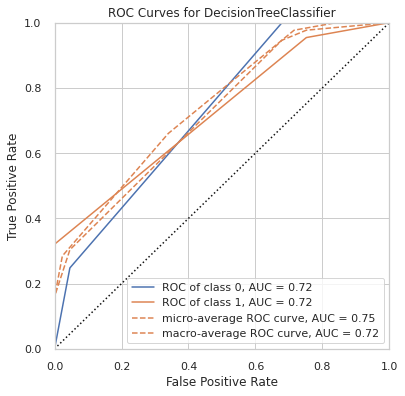

In [ ]:
from yellowbrick.classifier import ROCAUC
# Especificamos la curva ROC AUC
fig, ax = plt.subplots(figsize = (6,6))
roc_curves_visualizer = ROCAUC(
    clf_dt,					# Pasar el estimador del mejor modelo que 
    							# se obtiene de la validación cruzada.  
    	# Indicar las etiquetas de las clases.
    							# Cuidado con el orden de los nombres.
)
# Ajustamos la visualización a los datos de entrenamiento
roc_curves_visualizer.fit(X_train_clean, y_train)
# Evaluamos los errores en la predicción utilizando los datos de validación.
roc_curves_visualizer.score(X_validation_test_clean, y_val_and_test) 
# Dibjuamos la visualización.
roc_curves_visualizer.show();

Se muestra la curva ROC del modelo base de arbol de decisión, tanto para la clase 0(no cancelado), como para la clase 1 (cancelado), el área bajo la curva es 0.72, lo que indica que el clasificador utilizado no es aleatorio. Puede observarse que para este modelo existe una relación lineal entre el Recall y la tasa de falsos positivos en ambas clases

Se construye la curva de validación para un modelo de árboles de decisión, para observar el comportamiento de estos modelos cuando la profundidad del árbol cambia

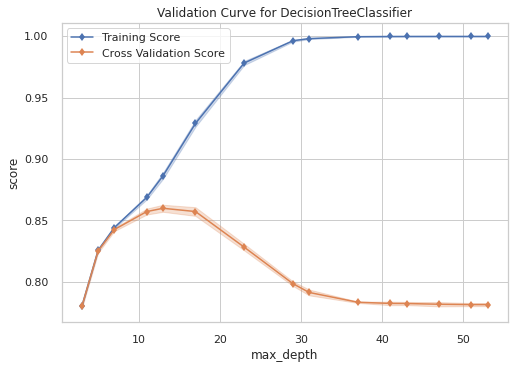

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from yellowbrick.model_selection import ValidationCurve

# Especificamos un modelo de árbol de decisión
clf_dt = DecisionTreeClassifier(
    max_depth = 4, 
    class_weight = 'balanced', 	# Indicamos que se deben reponderar las clases.
    random_state=1234		# Indicamos una semilla para reproducibilidad.
)

# Especificamos la curva de validación
viz = ValidationCurve(
    clf_dt, 							# Especificar el modelo (debe ser un estiamdor)
    param_name="max_depth",				# Especificar un solo hiperparámetro a evaluar
    param_range=[3, 5, 7, 11, 13, 17, 	# Dara una lista o numpy.array con los valores probar
    			23, 29, 31, 37, 41, 
    			43, 47, 51, 53], 
    cv=5, 								# Indicar el valor k, para construir la validación cruzada
    scoring="roc_auc",					# Indicar la métrica de evaluación para el modelo.
    n_jobs=-1							# Indicar cuántos CPUs utilizar para paralelizar el trabajo.
    									# n_jobs=-1, signfica utilizar todos los CPUs disponibles.
)
# Ajustamos el modelo y la visualización
viz.fit(X_train_clean, y_train)
# Imprimimos en la pantalla la visualización.
viz.show();

A continuación se mostrará la curva de validación con la variación del parametro de las hojas mínimas

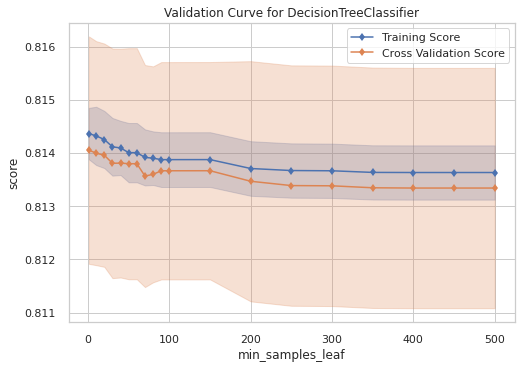

In [ ]:
viz = ValidationCurve(
    clf_dt, 							
    param_name="min_samples_leaf",		# Probamos con un nuevo hiperparámetro 
    param_range=[1, 10, 20, 30, 40,		# Especificamos una lista con los nuevos
    			50, 60, 70, 80, 90,		# valores. 
    			100, 150, 200, 250, 
    			300, 350, 400, 450, 
    			500], 
    cv=5, 
    scoring="roc_auc",
    n_jobs=-1
)
# Ajustamos el modelo y la visualización
viz.fit(X_train_clean, y_train)
# Imprimimos en la pantalla la visualización.
viz.show();

De ambas curvas de validación puede observarse que la profundidad del árbol tiene valores óptimos entre 5 y aproximadamenter 12, sin embargo, se observa que la variación de las hojas no produce una mejora significativa en el modelo, por lo tanto se optará por la optimización de otro modelo de clasificación que produzca mejores resultados que el árbol clasificador

# Mejora de modelo de clasificación

Se optimizará un modelo de bosque aleatorio para buscar mejorar la clasificación que realizó el arbol de decision. A partir de este momento se utilizará validación cruzada de 5 cortes, dado que el número de datos en el conjunto de entrenamiento es del orden de 80 000, se espera que k= 5 produzca buenos resultados

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

Se lleva a cabo una búsqueda aleatoria de los hiperparámetros que producen un mejor modelo de bosque aleatorio

In [ ]:
# Especificar bosque aleatorio
clf_rf = RandomForestClassifier(
    random_state = 1234, 
    class_weight = 'balanced'
)
params = {                                                          
    'n_estimators' : [25, 50, 100, 120, 150, 200, 300, 450, 500],        # <--- Declara el rango del número de árboles en el bosque 'n_estimators'
    'max_depth': [3, 4, 5, 7, 12, 15]             # <--- Declara el rango de la profundidad de los árboles 'max_depth'
    }
# Especificar opciones del Grid Search 
random_search = RandomizedSearchCV(
    clf_rf, 				# Indicar el modelo (debe ser un estimador).
    scoring = 'roc_auc', 	# Indicar la métrica para evaluar el desempeño del
    						# modelo en validación cruzada.
    param_distributions=params, 		# Indicar el diccionario de parámetros y valores
    cv = 5, 				# Indicar los k cortes de validación cruzada.
    return_train_score=True,# Agregar el error de entrenamiento
    n_jobs = -1,
    n_iter=15				# Indicar cuántos CPUs utilizar para paralelizar el 
    						# trabajo.
    
)
# Entrenar los modelos
random_search.fit(X_train_clean, y_train)

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=1234),
                   n_iter=15, n_jobs=-1,
                   param_distributions={'max_depth': [3, 4, 5, 7, 12, 15],
                                        'n_estimators': [25, 50, 100, 120, 150,
                                                         200, 300, 450, 500]},
                   return_train_score=True, scoring='roc_auc')

A fin de observar el comportamiento del score para la búsqueda aleatoria de parámetros se construye una herramienta de visualización que recuperará los resultados de la validación cruzada y los clasificará de acuerdo con su rendimiento en el entrenamiento y validación

In [ ]:
def fun_plot_grid_search_results(df):   
    '''Regresa un DataFrame con los resultados de la exploración de hiperparámetros.

    Esta función muestra una tabla estilizada con los resultados de la exploración de
    hiper parámetros utilizando validación cruzada.
    
    En la tabla aparecen del lado izquierdo la combinación de hiperparámetros, el error
    de entrenamiento y el error de validación cruzada y el ranking del mejor modelo
    a partir del error de validación.
    
    El mapa de color va de azul (modelos con menor error) a rojo (modelos con mayor error).
    Se calcula para el error de entrenamiento y validación de manera separada.
    
    Los resultados están ordenados de mejor a peor modelo, en función del error de validación.
    
    Parameters
    ----------
    dict: Diccionario con los resultados de la búsqueda de hiperparámetros GridSearchCV.cv_results_ 
        
    Returns
    -------
    pandas.io.formats.style.Styler
        Regresa una tabla estilizada con los resultados de la búsqueda de hiperparámetros.
    '''
    # Elegir paleta divergente de colores
    cm = sns.diverging_palette(5, 250, as_cmap=True)
    
    return (
        pd.concat([
            # Limpiar la columna de parámetros
            df['params'].apply(pd.Series), 
            # Extraer solamente el error de prueba 
            df[['mean_train_score', 'mean_test_score', 'rank_test_score']]],
            axis = 1
        )
        # Ordenar los modelos de mejor a peor
        .sort_values(by = 'rank_test_score')
        # Pintar el fondo de la celda a partir del error de validación
        .style.background_gradient(cmap=cm, subset = ['mean_train_score', 'mean_test_score'])
    )

In [ ]:
# Recupearar los resultados de la validación cruzada
df_best_params = pd.DataFrame(random_search.cv_results_)
tabla_resultados = fun_plot_grid_search_results(df_best_params)
tabla_resultados

,n_estimators,max_depth,mean_train_score,mean_test_score,rank_test_score
14,200,15,0.913483,0.888612,1
6,300,15,0.913575,0.888554,2
1,25,15,0.910270,0.885039,3
11,300,12,0.890529,0.877002,4
3,450,12,0.890556,0.876974,5
7,150,12,0.890251,0.876790,6
10,120,12,0.890288,0.876731,7
2,100,12,0.890174,0.876699,8
4,150,7,0.856783,0.853373,9
5,200,7,0.856621,0.853289,10


In [ ]:
def fun_resumen_grid_search(random_search):
    '''Imprime un resumen del random search.
    
    Imprime el número de modelos que se entrenaron y 
    devuelve los hiperparámetros del mejor modelo.
    
    Parameters
    ----------
    grid_search (GridSearchCV): Fitted GridSearch con los resultados.
    '''
    best_params = random_search.best_params_
    print("\nSe evaluaron {} modelos utilizando el random search.".format(pd.DataFrame(random_search.cv_results_).shape[0]))
    print("\nLos hiperparámetros del mejor modelo son: " + str(best_params) + "\n")

In [ ]:
fun_resumen_grid_search(random_search)


Se evaluaron 15 modelos utilizando el grid search.

Los hiperparámetros del mejor modelo son: {'n_estimators': 200, 'max_depth': 15}



In [ ]:
best_model = random_search.best_estimator_

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


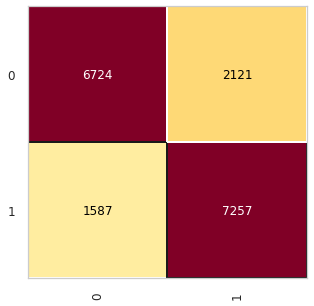

In [ ]:
from yellowbrick.classifier import ConfusionMatrix
fig, ax = plt.subplots(figsize = (5,5))
# Creamos la matrix de confusión
cm = ConfusionMatrix(
    best_model, 				# Pasar el estimador del mejor modelo que 
    							# se obtiene de la validación cruzada. 
    	# Indicar las etiquetas de las clases.
    							# Cuidado con el orden de los nombres.
)
# Ajustamos la visualización a los datos de entrenamiento
cm.fit(X_train_clean, y_train)
# Evaluamos los errores en la predicción utilizando los datos de validación.
cm.score(X_validation_test_clean, y_val_and_test)
# Dibjuamos la visualización.
cm.show;

La matriz de confusión  de este modelo nos muestra la mejoría en las predicciones que requerimos, ya que disminuyó considerablemente el número de clientes que el modelo predecía que cancelarían y que finalmente cancelaron, lo que mejora las predicciones del modelo original

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


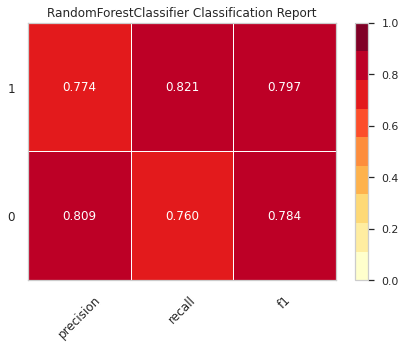

In [ ]:
from yellowbrick.classifier import ClassificationReport
fig, ax = plt.subplots(figsize = (6,5))
visualizer = ClassificationReport(
    best_model,					# Pasar el estimador del mejor modelo que 
    							# se obtiene de la validación cruzada. 
                  # Indicar las etiquetas de las clases.
    							# Cuidado con el orden de los nombres.
)
# Ajustamos la visualización a los datos de entrenamiento
visualizer.fit(X_train_clean, y_train)
# Evaluamos los errores en la predicción utilizando los datos de validación.
visualizer.score(X_validation_test_clean, y_val_and_test)
# Dibjuamos la visualización.
visualizer.show();

En este caso podemos observar que tenemos valores mucho más altos para las métricas con respecto del modelo base, posiblemente aún se pueden mejorar los hiperparámetros, sin embargo, la búsqueda aleatoria produjo resultados muy buenos, ya que esta vez el modelo es capaz de acertar hasta en alrededor de un 80% las predicciones que realiza, por lo tanto es una mejora considerable del modelo más sencillo de arbol de decisión

El bosque aleatorio, mejora los resultados que se pueden obtener con el ajuste de hiperparámetros del árbol de decisión, sin embargo hay que mencionar que el modelo de bosque aleatorio acierta menos al predecir los clientes que cancelarían y que finalmente no cancelaron, debido al trade-off que existe entre precision y recall, sin embargo, implica una mucho mayor pérdida ecónomica perder la reservación, que dar algunos beneficios a los  huéspedes. Las curvas de validación nos permiten determinar que las predicciones del bosque aleatorio son mejores, pero aun así las predicciones del arbol no son realmente tan malas, considerando la sencillez del modelo con respecto del bosque

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


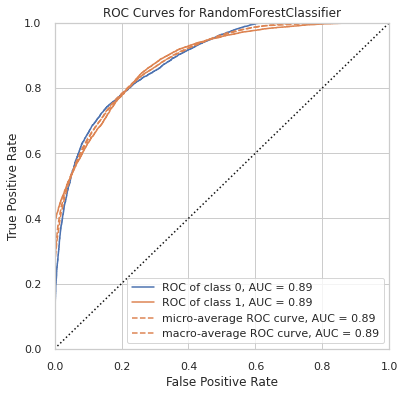

In [ ]:
from yellowbrick.classifier import ROCAUC
# Especificamos la curva ROC AUC
fig, ax = plt.subplots(figsize = (6,6))
roc_curves_visualizer = ROCAUC(
    best_model,					# Pasar el estimador del mejor modelo que 
    							# se obtiene de la validación cruzada.  
   		# Indicar las etiquetas de las clases.
    							# Cuidado con el orden de los nombres.
)
# Ajustamos la visualización a los datos de entrenamiento
roc_curves_visualizer.fit(X_train_clean, y_train)
# Evaluamos los errores en la predicción utilizando los datos de validación.
roc_curves_visualizer.score(X_validation_test_clean, y_val_and_test) 
# Dibjuamos la visualización.
roc_curves_visualizer.show();

La curva ROC forma un área mayor con respecto del modelo base, que es de 0.89, comparado con 0.72, por lo tanto el modelo de bosque aleatorio con los mejores parámetros es mucho mejor para los propósitos de este problema de clasificación que el de arbol de decisión

Finalmente se muestran las propiedades más importantes para el modelo de bosque aleatorio

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


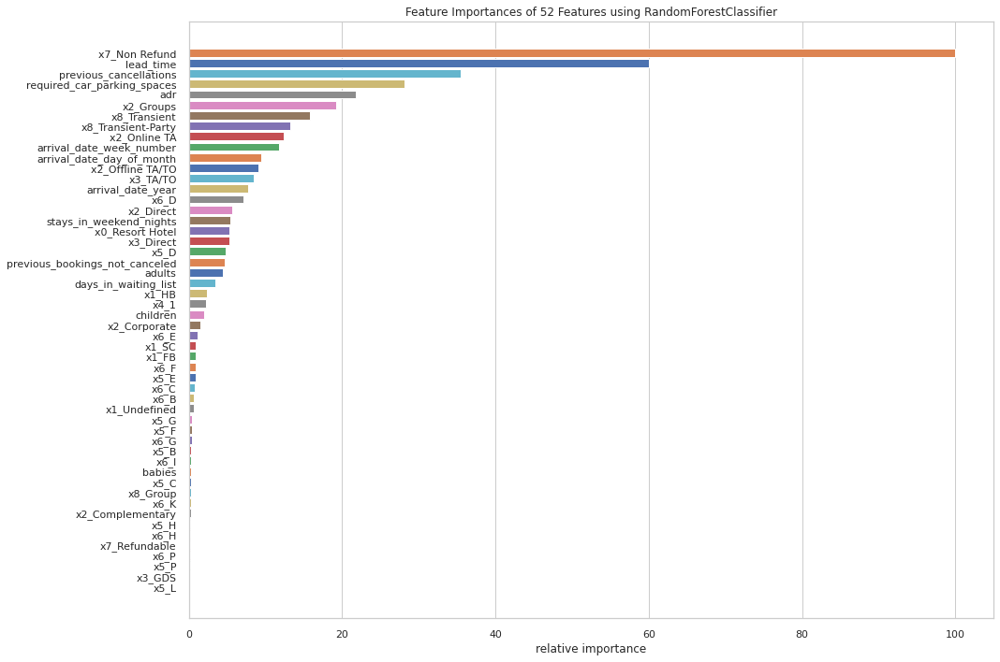

In [ ]:
from yellowbrick.model_selection import FeatureImportances
# Especificamos la gráfica
fig, ax = plt.subplots(figsize = (15,10))
viz = FeatureImportances(best_model) 	# Pasar el estimador del mejor modelo que 
    									# se obtiene de la validación cruzada.
# Ajustamos la visualización a los datos de entrenamiento
viz.fit(X_train_clean, y_train)
# Dibjuamos la visualización.
viz.show();

Se observa que la más importante es la categoría sin reembolso, que proviene del tipo ed depósito, seguida por el tiempo de espera

A continuación se crea un dataframe basado en el conjunto con clases balanceadas original, se calcula la probabilidad asociada a cada predicción, así como la predicción del mejor modelo, que corresponde a un bosque aleatorio con 200 estimadores y profundidad máxima 15

In [ ]:
y_preda_data = best_model.predict(df_sal)

In [ ]:
y_preda_data

array([1, 0, 1, ..., 0, 1, 0])

In [ ]:
# Utilizar el mejor modelo para predecir la probabilidad.
y_pred_proba_data = best_model.predict_proba(df_sal)[:,1]

In [ ]:
y_pred_proba_data

array([0.57372276, 0.35335813, 0.58047053, ..., 0.2627164 , 0.5511314 ,
       0.42659027])

In [ ]:
df_fin=pd.DataFrame()

In [ ]:
prob= pd.Series(y_pred_proba_data)
y_pred= pd.Series(y_preda_data)

In [ ]:
df_fin['proba']=prob
df_fin['pred']=y_pred

In [ ]:
df_fin.index.name="ID_host"

In [ ]:
df_fin

,proba,pred
ID_host,,
0,0.573723,1
1,0.353358,0
2,0.580471,1
3,0.177967,0
4,0.439319,0
...,...,...
88439,0.509090,1
88440,0.152786,0
88441,0.262716,0


In [ ]:
df_fin.to_csv('Predicciones.csv')